In [27]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os


In [28]:
!pip install segmentation-models==1.0.1

# Preparation

In [29]:
import PIL
from PIL import Image
import numpy as np
import pandas as pd 

import imageio
import imgaug as ia
import imgaug.augmenters as iaa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib

import plotly.offline as pyo
pyo.init_notebook_mode()
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import cv2 
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn import preprocessing
import random
import tensorflow as tf
import warnings
warnings.filterwarnings("ignore")
#!pip install visualkeras

from matplotlib import image
from matplotlib import pyplot

In [30]:
import os
import pandas as pd

def Create_Directory_DataFrame():
    # Initialize an empty list to hold rows
    rows = []
    basedir = '/kaggle/input/indian-diabetic-retinopathy-image-dataset/A.%20Segmentation/A. Segmentation/1. Original Images/'
    
    # Iterate through each class in the base directory
    for Class in os.listdir(basedir):
        # Iterate through each file in the class directory
        for location in os.listdir(os.path.join(basedir, Class)):
            if location.endswith('.jpg'):
                # Split the class name and check its length
                class_split = Class.split(' ')
                
                # Get the class name safely
                class_name = class_split[1] if len(class_split) > 1 else class_split[0]
                
                # Append a dictionary representing a row to the list
                rows.append({
                    'Class': class_name,
                    'Location': os.path.join(basedir, Class, location),
                    'ID': location.split('.')[0].split('_')[1] if '_' in location else location.split('.')[0]  # Check for '_'
                })

    # Create a DataFrame from the list of rows
    df = pd.DataFrame(rows)
    
    # Shuffle the DataFrame
    df = df.sample(frac=1).reset_index(drop=True)
    
    return df

# Call the function and display the shape and first few rows
df_origianl_small = Create_Directory_DataFrame()
print(df_origianl_small.shape)
df_origianl_small.head(20)
# Save the DataFrame as a CSV file
output_csv_path = '/kaggle/working/original.csv'  # Specify your desired output file name and path
df_origianl_small.to_csv(output_csv_path, index=False)  # Save the DataFrame without row indices

(81, 3)


In [31]:
df_origianl_small.head()

,Class,Location,ID
0,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,39
1,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,36
2,Testing,/kaggle/input/indian-diabetic-retinopathy-imag...,80
3,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,11
4,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,31


In [32]:
import os
import pandas as pd

def Create_Directory_Array():
    # Initialize an empty list to store row dictionaries
    rows = []
    basedir = '/kaggle/input/indian-diabetic-retinopathy-image-dataset/A.%20Segmentation/A. Segmentation/2. All Segmentation Groundtruths/'
    
    # Iterate through each class in the base directory
    for Class in os.listdir(basedir):
        # Ensure we are reading only directories
        class_path = os.path.join(basedir, Class)
        if os.path.isdir(class_path):  # Check if it's a directory
            # Handle cases where Class might not have enough parts
            class_parts = Class.split(' ')
            class_label = class_parts[1] if len(class_parts) > 1 else class_parts[0]  # Fallback to the whole Class name
            
            for subclass in os.listdir(class_path):
                subclass_path = os.path.join(class_path, subclass)
                if os.path.isdir(subclass_path):  # Check if it's a directory
                    for location in os.listdir(subclass_path):
                        if location.endswith('.tif'):  # Check if the file is a .tif image
                            # Append a dictionary representing a row to the list
                            rows.append({
                                'Class': class_label,
                                'SubClass': subclass,  # If subclassing is not required, you can remove this
                                'Location': os.path.join(class_path, subclass, location),
                                'ID': location.split('.')[0].split('_')[1] if '_' in location else location.split('.')[0]  # Safeguard for IDs
                            })

    return rows  # Return the collected rows

# Call the function to get the array of data
data_array = Create_Directory_Array()

# Create a DataFrame from the returned array of rows
df_mask = pd.DataFrame(data_array)

# Shuffle the DataFrame
df_mask_small = df_mask.sample(frac=1).reset_index(drop=True)

# Display the shape and first few rows of the DataFrame
print(df_mask_small.shape)
print(df_mask_small.head(20))
# Save the DataFrame as a CSV file
output_csv_path = '/kaggle/working/mask.csv'  # Specify your desired output file name and path
df_mask_small.to_csv(output_csv_path, index=False)  # Save the DataFrame without row indices

(363, 4)
       Class           SubClass  \
0   Training    2. Haemorrhages   
1   Training  1. Microaneurysms   
2   Training    2. Haemorrhages   
3   Training  1. Microaneurysms   
4    Testing  1. Microaneurysms   
5   Training    2. Haemorrhages   
6   Training   3. Hard Exudates   
7    Testing   4. Soft Exudates   
8   Training  1. Microaneurysms   
9   Training   3. Hard Exudates   
10  Training   3. Hard Exudates   
11  Training   3. Hard Exudates   
12   Testing      5. Optic Disc   
13  Training   4. Soft Exudates   
14  Training    2. Haemorrhages   
15  Training    2. Haemorrhages   
16  Training  1. Microaneurysms   
17  Training   4. Soft Exudates   
18  Training  1. Microaneurysms   
19  Training      5. Optic Disc   

                                             Location  ID  
0   /kaggle/input/indian-diabetic-retinopathy-imag...  08  
1   /kaggle/input/indian-diabetic-retinopathy-imag...  53  
2   /kaggle/input/indian-diabetic-retinopathy-imag...  17  
3   /kaggle/inp

In [33]:
# Define the unwanted subclass names
unwanted_subclasses = ['4. Soft Exudates', '5. Optic Disc']

# Filter out rows where 'SubClass' column contains unwanted values
df_mask_small = df_mask_small[~df_mask_small['SubClass'].isin(unwanted_subclasses)]

# Display the shape and first few rows of the filtered DataFrame
print(df_mask_small.shape)
print(df_mask_small.head(20))

# Save the filtered DataFrame as a CSV file
output_csv_path = '/kaggle/working/mask_filtered.csv'  # Specify your desired output file name and path
df_mask_small.to_csv(output_csv_path, index=False)  # Save the DataFrame without row indices


(242, 4)
       Class           SubClass  \
0   Training    2. Haemorrhages   
1   Training  1. Microaneurysms   
2   Training    2. Haemorrhages   
3   Training  1. Microaneurysms   
4    Testing  1. Microaneurysms   
5   Training    2. Haemorrhages   
6   Training   3. Hard Exudates   
8   Training  1. Microaneurysms   
9   Training   3. Hard Exudates   
10  Training   3. Hard Exudates   
11  Training   3. Hard Exudates   
14  Training    2. Haemorrhages   
15  Training    2. Haemorrhages   
16  Training  1. Microaneurysms   
18  Training  1. Microaneurysms   
20  Training   3. Hard Exudates   
21  Training  1. Microaneurysms   
23  Training  1. Microaneurysms   
24   Testing  1. Microaneurysms   
25   Testing   3. Hard Exudates   

                                             Location  ID  
0   /kaggle/input/indian-diabetic-retinopathy-imag...  08  
1   /kaggle/input/indian-diabetic-retinopathy-imag...  53  
2   /kaggle/input/indian-diabetic-retinopathy-imag...  17  
3   /kaggle/inp

In [34]:
df_mask_small.groupby(['SubClass']).count()

,Class,Location,ID
SubClass,,,
1. Microaneurysms,81,81,81
2. Haemorrhages,80,80,80
3. Hard Exudates,81,81,81


In [35]:
joined_small = pd.merge(df_origianl_small, df_mask_small, left_on='ID', right_on='ID')

joined_small.to_csv('joined.csv', index=False)
joined_small.head()

,Class_x,Location_x,ID,Class_y,SubClass,Location_y
0,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,39,Training,1. Microaneurysms,/kaggle/input/indian-diabetic-retinopathy-imag...
1,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,39,Training,3. Hard Exudates,/kaggle/input/indian-diabetic-retinopathy-imag...
2,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,39,Training,2. Haemorrhages,/kaggle/input/indian-diabetic-retinopathy-imag...
3,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,36,Training,3. Hard Exudates,/kaggle/input/indian-diabetic-retinopathy-imag...
4,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,36,Training,1. Microaneurysms,/kaggle/input/indian-diabetic-retinopathy-imag...


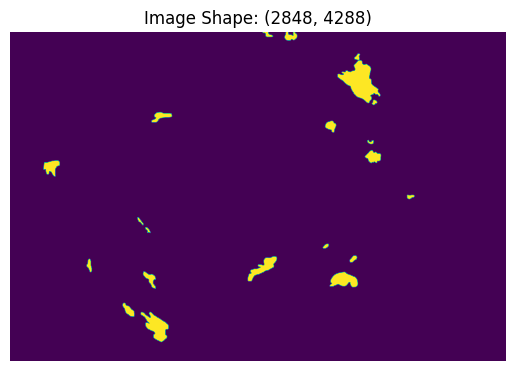

Image Shape: (2848, 4288)


In [63]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Function to open and display an image from a DataFrame
def display_image_from_dataframe(dataframe, row_index, column_index):
    try:
        # Open the image
        image_path = dataframe.iloc[row_index, column_index]
        image = Image.open(image_path)

        # Convert image to NumPy array
        image_array = np.array(image)

        # Display the image
        plt.imshow(image_array)
        plt.axis('off')  # Hide the axis
        plt.title(f"Image Shape: {image_array.shape}")  # Title with shape info
        plt.show()

        # Print the shape of the image array
        print("Image Shape:", image_array.shape)

    except Exception as e:
        print("Error:", e)

# Call the function to display the image
display_image_from_dataframe(joined_small, 23, 5)


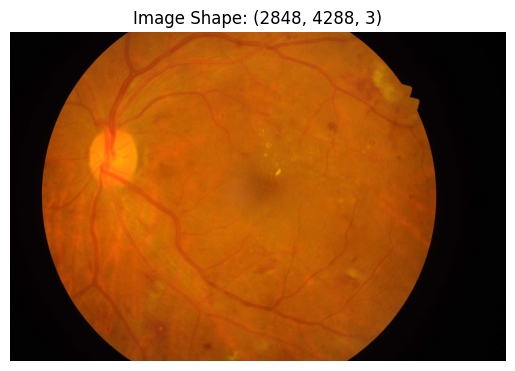

Image Shape: (2848, 4288, 3)


In [64]:
display_image_from_dataframe(joined_small, 23, 1)


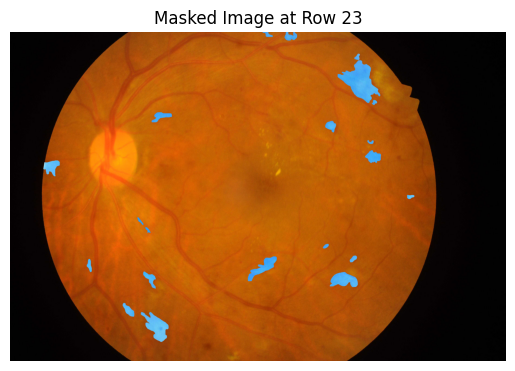

In [62]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

# Function to display the masked image from a DataFrame
def display_masked_image(dataframe, row_index, image_col_index, mask_col_index):
    try:
        # Open the image
        image_path = dataframe.iloc[row_index, image_col_index]
        mask_path = dataframe.iloc[row_index, mask_col_index]

        # Read the image and mask
        img = cv2.imread(image_path)
        imarray = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Read mask as grayscale

        # Ensure the image is read properly
        if img is None or imarray is None:
            print("Error: Could not read image or mask file.")
            return

        # Apply the mask using cv2.bitwise_not
        masked = cv2.bitwise_not(img, img, mask=imarray)

        # Display the masked image
        plt.imshow(cv2.cvtColor(masked, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
        plt.axis('off')  # Hide the axis
        plt.title(f"Masked Image at Row {row_index}")
        plt.show()

    except Exception as e:
        print("Error:", e)

# Example usage: display masked image from the 'joined' DataFrame
display_masked_image(joined_small, 23, 1, 5)


In [39]:
#w,h = 2848,4288.
w,h=512,512

In [40]:
from tqdm import tqdm
def load_img(addr,w,h):
    img = cv2.imread(addr,0)
    img = img.astype('float32')
    img = cv2.resize(img, (w,h), interpolation = cv2.INTER_AREA)
    img = img.reshape(w,h,1)
    return img
def load_mask(addr,w,h):
    im = Image.open(addr)
    imarray = np.array(im)
    if len(imarray.shape) == 3:
        imarray = imarray[:,:,0]
    img = cv2.resize(imarray, (w,h), interpolation = cv2.INTER_AREA)
    img = img.reshape(w,h,1)
    return img
def load_data(df,w,h):
    Image = []
    Masks = []
    for i in tqdm(df.index):
        image = load_img(df.loc[i]['Location_x'],w,h)
        mask = load_mask(df.loc[i]['Location_y'],w,h)
        
        Image.append(image)
        Masks.append(mask)
    return np.float32(np.array(Image)) , np.float32(np.array(Masks))

 



In [41]:
segment_choice_small = '1. Microaneurysms'
seg_Microaneurysms_new_small = joined_small[joined_small['SubClass'] ==  segment_choice_small]
print(seg_Microaneurysms_new_small.shape)
seg_Microaneurysms_new_small.head()

(81, 6)


,Class_x,Location_x,ID,Class_y,SubClass,Location_y
0,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,39,Training,1. Microaneurysms,/kaggle/input/indian-diabetic-retinopathy-imag...
4,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,36,Training,1. Microaneurysms,/kaggle/input/indian-diabetic-retinopathy-imag...
6,Testing,/kaggle/input/indian-diabetic-retinopathy-imag...,80,Testing,1. Microaneurysms,/kaggle/input/indian-diabetic-retinopathy-imag...
10,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,11,Training,1. Microaneurysms,/kaggle/input/indian-diabetic-retinopathy-imag...
14,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,31,Training,1. Microaneurysms,/kaggle/input/indian-diabetic-retinopathy-imag...


In [42]:
segment_choice_small = '3. Hard Exudates'
seg_Hard_Exudates_new_small= joined_small[joined_small['SubClass'] ==  segment_choice_small]
print(seg_Hard_Exudates_new_small.shape)
seg_Hard_Exudates_new_small.head()

(81, 6)


,Class_x,Location_x,ID,Class_y,SubClass,Location_y
1,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,39,Training,3. Hard Exudates,/kaggle/input/indian-diabetic-retinopathy-imag...
3,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,36,Training,3. Hard Exudates,/kaggle/input/indian-diabetic-retinopathy-imag...
7,Testing,/kaggle/input/indian-diabetic-retinopathy-imag...,80,Testing,3. Hard Exudates,/kaggle/input/indian-diabetic-retinopathy-imag...
9,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,11,Training,3. Hard Exudates,/kaggle/input/indian-diabetic-retinopathy-imag...
13,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,31,Training,3. Hard Exudates,/kaggle/input/indian-diabetic-retinopathy-imag...


In [43]:
segment_choice_small = '2. Haemorrhages'
seg_Haemorrhages_new_small= joined_small[joined_small['SubClass'] ==  segment_choice_small]
print(seg_Haemorrhages_new_small.shape)
seg_Haemorrhages_new_small.head()

(80, 6)


,Class_x,Location_x,ID,Class_y,SubClass,Location_y
2,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,39,Training,2. Haemorrhages,/kaggle/input/indian-diabetic-retinopathy-imag...
5,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,36,Training,2. Haemorrhages,/kaggle/input/indian-diabetic-retinopathy-imag...
8,Testing,/kaggle/input/indian-diabetic-retinopathy-imag...,80,Testing,2. Haemorrhages,/kaggle/input/indian-diabetic-retinopathy-imag...
11,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,11,Training,2. Haemorrhages,/kaggle/input/indian-diabetic-retinopathy-imag...
12,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,31,Training,2. Haemorrhages,/kaggle/input/indian-diabetic-retinopathy-imag...


In [44]:
# Create separate DataFrames for training and testing
df_training = seg_Hard_Exudates_new_small[seg_Hard_Exudates_new_small['Class_x'] == 'Training'].reset_index(drop=True)
df_testing = seg_Hard_Exudates_new_small[seg_Hard_Exudates_new_small['Class_x'] == 'Testing'].reset_index(drop=True)

# Display the separate DataFrames
print("Training DataFrame:")
print(df_training)

print("\nTesting DataFrame:")
print(df_testing)

Training DataFrame:
     Class_x                                         Location_x  ID   Class_y  \
0   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  39  Training   
1   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  36  Training   
2   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  11  Training   
3   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  31  Training   
4   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  44  Training   
5   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  25  Training   
6   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  50  Training   
7   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  33  Training   
8   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  27  Training   
9   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  09  Training   
10  Training  /kaggle/input/indian-diabetic-retinopathy-imag...  34  Training   
11  Trai

In [45]:
X, Y = load_data(df_training,w,h)

100%|██████████| 54/54 [00:04<00:00, 11.05it/s]


In [46]:
X_test, Y_test = load_data(df_testing,w,h)

100%|██████████| 27/27 [00:02<00:00, 11.01it/s]


In [47]:
from sklearn.model_selection import train_test_split

X_valid, X_test_final, Y_valid, Y_test_final = train_test_split(
    X_test, Y_test, test_size=0.8, random_state=42  # Adjust test_size and random_state as needed
)

# Model 1

In [48]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"
import segmentation_models as sm

In [ ]:
import segmentation_models as sm
import tensorflow as tf
import numpy as np

# Model parameters
BACKBONE = 'vgg16'  # Use VGG16 as the backbone
BATCH_SIZE = 8
CLASSES = ['Retinal']
LR = 0.0001
EPOCHS = 200
w, h = 512, 512  # Set your input dimensions appropriately

# Preprocessing function
preprocess_input = sm.get_preprocessing(BACKBONE)

# Define network parameters
n_classes = 1 if len(CLASSES) == 1 else (len(CLASSES) + 1)  # for binary and multiclass segmentation
activation = 'sigmoid' if n_classes == 1 else 'relu'

# Define optimizer
optim_gray = tf.keras.optimizers.Adam(LR)

# Define losses
dice_loss = sm.losses.DiceLoss()
focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
total_loss_gray = 0.9 * dice_loss + 0.1 * focal_loss

# Define metrics
metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

# Create the model for grayscale input without pretrained encoder weights
model_vgg16_relu = sm.Unet(
    BACKBONE,
    input_shape=(w, h, 1),  # Keep input as grayscale
    encoder_weights=None,  # Do not load pretrained weights
    classes=n_classes,
    activation=activation
)

# Compile the model for grayscale input
model_vgg16_relu.compile(optimizer=optim_gray, loss=total_loss_gray, metrics=metrics)

# Custom callback to print training metrics only
class CustomVerbose(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        # Print training metrics without validation metrics
        print(f"Epoch {epoch + 1}/{self.params['epochs']} - "
              f"loss: {logs.get('loss'):.4f} - "
              f"ioU_score: {logs.get('iou_score'):.4f} - "
              f"f1-score: {logs.get('f1-score'):.4f}")


In [54]:
model_vgg16_relu.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 512, 512,  │        640 │ input_layer_1[0]… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 512, 512,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 256, 256,  │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 256, 256,  │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 256, 256,  │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 128, 128,  │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 128, 128,  │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 128, 128,  │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 128, 128,  │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 64, 64,    │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 64, 64,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 64, 64,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 64, 64,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 32, 32,    │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv1        │ (None, 32, 32,    │  2,359,808 │ block4_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv2        │ (None, 32, 32,    │  2,359,808 │ block5_conv1[0][

 Total params: 71,245,301 (271.78 MB)

 Trainable params: 23,747,089 (90.59 MB)

 Non-trainable params: 4,032 (15.75 KB)

 Optimizer params: 47,494,180 (181.18 MB)

In [49]:

# Fit the model with the custom verbose output
history_vgg16_relu = model_vgg16_relu.fit(
    x=X,  # Feed the grayscale images
    y=Y,
    batch_size=BATCH_SIZE,
    epochs=550,
    validation_data=(X_valid, Y_valid),  # Validation data
    verbose=0,  # Suppress default output
    callbacks=[CustomVerbose()]  # Include the custom verbose callback
)


Epoch 1/550 - loss: 0.9073 - ioU_score: 0.0118 - f1-score: 0.0233
Epoch 2/550 - loss: 0.8947 - ioU_score: 0.0252 - f1-score: 0.0487
Epoch 3/550 - loss: 0.8898 - ioU_score: 0.0412 - f1-score: 0.0770
Epoch 4/550 - loss: 0.8859 - ioU_score: 0.0507 - f1-score: 0.0955
Epoch 5/550 - loss: 0.8827 - ioU_score: 0.0641 - f1-score: 0.1197
Epoch 6/550 - loss: 0.8809 - ioU_score: 0.0726 - f1-score: 0.1321
Epoch 7/550 - loss: 0.8780 - ioU_score: 0.0852 - f1-score: 0.1561
Epoch 8/550 - loss: 0.8764 - ioU_score: 0.1036 - f1-score: 0.1819
Epoch 9/550 - loss: 0.8763 - ioU_score: 0.0863 - f1-score: 0.1544
Epoch 10/550 - loss: 0.8740 - ioU_score: 0.1107 - f1-score: 0.1968
Epoch 11/550 - loss: 0.8720 - ioU_score: 0.1070 - f1-score: 0.1867
Epoch 12/550 - loss: 0.8705 - ioU_score: 0.1135 - f1-score: 0.1997
Epoch 13/550 - loss: 0.8683 - ioU_score: 0.1231 - f1-score: 0.2159
Epoch 14/550 - loss: 0.8673 - ioU_score: 0.1297 - f1-score: 0.2242
Epoch 15/550 - loss: 0.8659 - ioU_score: 0.1352 - f1-score: 0.2312
Epoc

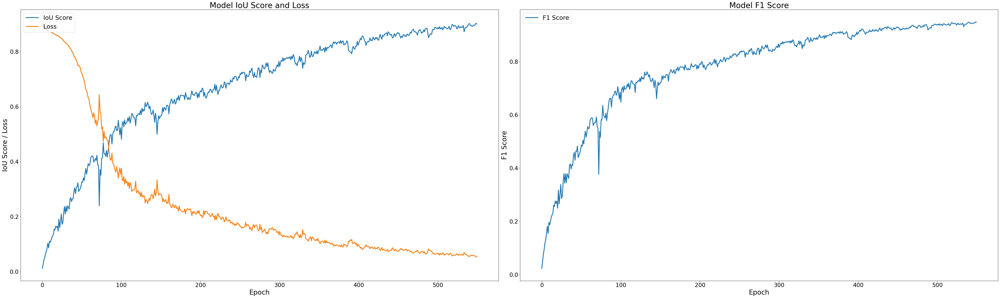

In [67]:
import matplotlib.pyplot as plt

# Assuming history_vgg16_relu.history contains the training logs

# Increase figure size and adjust text size
plt.figure(figsize=(50, 15))

# IoU Score and Loss Plot
plt.subplot(121)
plt.plot(history_vgg16_relu.history['iou_score'], linewidth=3)  # Increase line width for visibility
plt.plot(history_vgg16_relu.history['loss'], linewidth=3)
plt.title('Model IoU Score and Loss', fontsize=28)  # Larger title text
plt.ylabel('IoU Score / Loss', fontsize=24)  # Larger y-axis label text
plt.xlabel('Epoch', fontsize=24)  # Larger x-axis label text
plt.xticks(fontsize=20)  # Larger x-axis ticks
plt.yticks(fontsize=20)  # Larger y-axis ticks
plt.legend(['IoU Score', 'Loss'], loc='upper left', fontsize=22)  # Larger legend text

# Plot training F1 score values
plt.subplot(122)
plt.plot(history_vgg16_relu.history['f1-score'], linewidth=3)  # Increase line width for visibility
plt.title('Model F1 Score', fontsize=28)  # Larger title text
plt.ylabel('F1 Score', fontsize=24)  # Larger y-axis label text
plt.xlabel('Epoch', fontsize=24)  # Larger x-axis label text
plt.xticks(fontsize=20)  # Larger x-axis ticks
plt.yticks(fontsize=20)  # Larger y-axis ticks
plt.legend(['F1 Score'], loc='upper left', fontsize=22)  # Larger legend text

# Show the plots
plt.tight_layout()
plt.show()


In [50]:
preds = model_vgg16_relu.predict(X_test_final).round()

2024-10-03 07:54:29.504589: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[22,32,256,256]{3,2,1,0}, u8[0]{0}) custom-call(f32[22,192,256,256]{3,2,1,0}, f32[32,192,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-10-03 07:54:30.316071: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.811614806s
Trying algorithm eng0{} for conv (f32[22,32,256,256]{3,2,1,0}, u8[0]{0}) custom-call(f32[22,192,256,256]{3,2,1,0}, f32[32,192,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_

1/1 ━━━━━━━━━━━━━━━━━━━━ 57s 57s/step


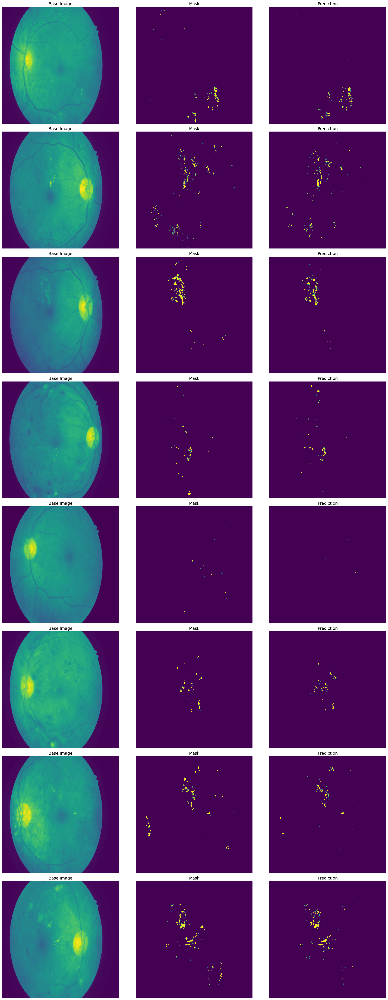

In [66]:
import matplotlib.pyplot as plt
import cv2  # Assuming you're using OpenCV for `cv2.bitwise_not`

# Get the number of predictions
num_preds = preds.shape[0]

# Calculate the number of rows needed for the plot
num_cols = 3  # Base Image, Mask, Prediction
num_rows = (num_preds + num_cols - 1) // num_cols  # Ceiling division

# Set the figure size
plt.figure(figsize=(20, num_rows * 6))

# Limit the number of subplots to the grid size
max_plots = num_rows * num_cols

# Iterate through the predictions and display images
for i in range(min(num_preds, max_plots // num_cols)):
    # Base Image
    plt.subplot(num_rows, num_cols, i * num_cols + 1)
    img = X_test_final[i].reshape(w, h)
    img = img.astype('uint8')
    plt.imshow(img)
    plt.title("Base Image", fontsize=14)  # Add title above the image
    plt.axis('off')  # Turn off axes for better visualization

    # Mask
    plt.subplot(num_rows, num_cols, i * num_cols + 2)
    yop = Y_test_final[i].reshape(w, h)
    yop = yop.astype('uint8')
    plt.imshow(yop)
    plt.title("Mask", fontsize=14)  # Add title above the image
    plt.axis('off')  # Turn off axes for better visualization

    # Prediction
    plt.subplot(num_rows, num_cols, i * num_cols + 3)
    prd = preds[i][..., 0].squeeze()
    prd = prd.astype('uint8')
    img = X_test_final[i].reshape(w, h)
    img = img.astype('uint8')
    plt.imshow(prd)
    plt.title("Prediction", fontsize=14)  # Add title above the image
    plt.axis('off')  # Turn off axes for better visualization

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

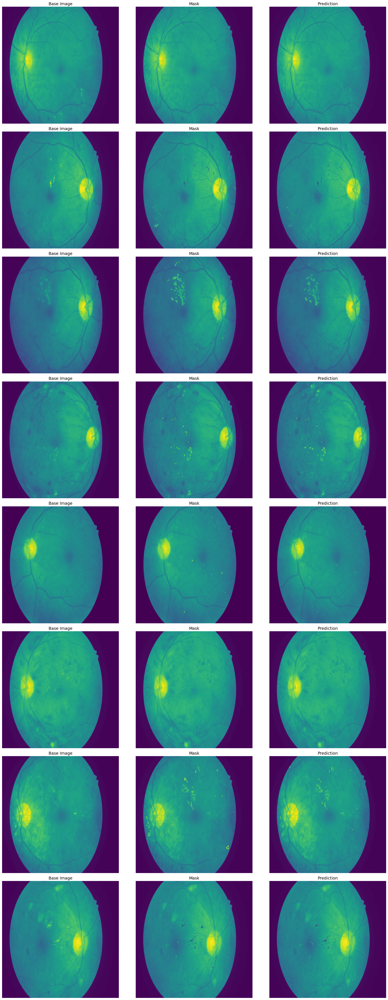

In [65]:
import matplotlib.pyplot as plt
import cv2  # Assuming you're using OpenCV for `cv2.bitwise_not`

# Get the number of predictions
num_preds = preds.shape[0]

# Calculate the number of rows needed for the plot
num_cols = 3  # Base Image, Mask, Prediction
num_rows = (num_preds + num_cols - 1) // num_cols  # Ceiling division

# Set the figure size
plt.figure(figsize=(20, num_rows * 6))

# Limit the number of subplots to the grid size
max_plots = num_rows * num_cols

# Iterate through the predictions and display images
for i in range(min(num_preds, max_plots // num_cols)):
    # Base Image
    plt.subplot(num_rows, num_cols, i * num_cols + 1)
    img = X_test_final[i].reshape(w, h)
    img = img.astype('uint8')
    plt.imshow(img)
    plt.title("Base Image", fontsize=14)  # Add title above the image
    plt.axis('off')  # Turn off axes for better visualization

    # Mask
    plt.subplot(num_rows, num_cols, i * num_cols + 2)
    yop = Y_test_final[i].reshape(w, h)
    yop = yop.astype('uint8')
    pim = cv2.bitwise_not(img, img, mask=yop)
    plt.imshow(pim)
    plt.title("Mask", fontsize=14)  # Add title above the image
    plt.axis('off')  # Turn off axes for better visualization

    # Prediction
    plt.subplot(num_rows, num_cols, i * num_cols + 3)
    prd = preds[i][..., 0].squeeze()
    prd = prd.astype('uint8')
    img = X_test_final[i].reshape(w, h)
    img = img.astype('uint8')
    pimm = cv2.bitwise_not(img, img, mask=prd)
    plt.imshow(pimm)
    plt.title("Prediction", fontsize=14)  # Add title above the image
    plt.axis('off')  # Turn off axes for better visualization

# Adjust layout and show the plot
plt.tight_layout()
plt.show()
